In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import h5py
import timeit
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN

%alias_magic t timeit

# import warnings filter
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)


image = h5py.File('image_ijk.h5', 'r')
image.keys()


Created `%t` as an alias for `%timeit`.
Created `%%t` as an alias for `%%timeit`.


<KeysViewHDF5 ['data']>

In [2]:
data = image.get('data')
data = np.array(data)
print(data)

[[0.0000000e+00 0.0000000e+00 7.9177044e-02 ... 0.0000000e+00
  6.0000000e+00 1.0000000e+00]
 [0.0000000e+00 0.0000000e+00 2.8918898e-01 ... 2.0000000e+00
  7.0000000e+00 1.0000000e+00]
 [0.0000000e+00 0.0000000e+00 2.6269868e-01 ... 3.0000000e+00
  3.0000000e+00 1.0000000e+00]
 ...
 [0.0000000e+00 3.2767000e+04 3.9665824e-01 ... 2.0000000e+00
  9.9600000e+02 1.0000000e+00]
 [0.0000000e+00 3.2767000e+04 1.5579028e-01 ... 0.0000000e+00
  9.9600000e+02 1.0000000e+00]
 [0.0000000e+00 0.0000000e+00 5.2702278e-02 ... 0.0000000e+00
  0.0000000e+00 1.0000000e+00]]


dx: 0  dy: 1  dz: 0


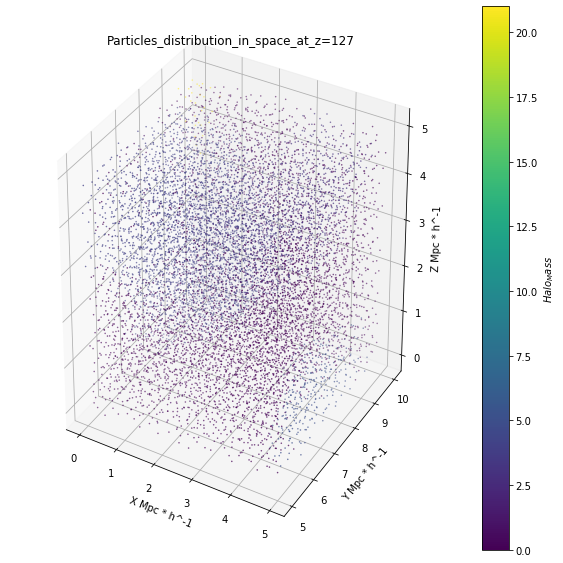

dx: 6  dy: 1  dz: 7


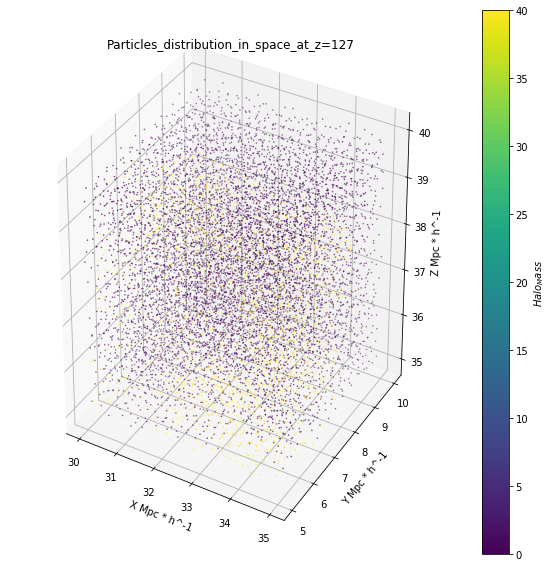

dx: 0  dy: 4  dz: 1


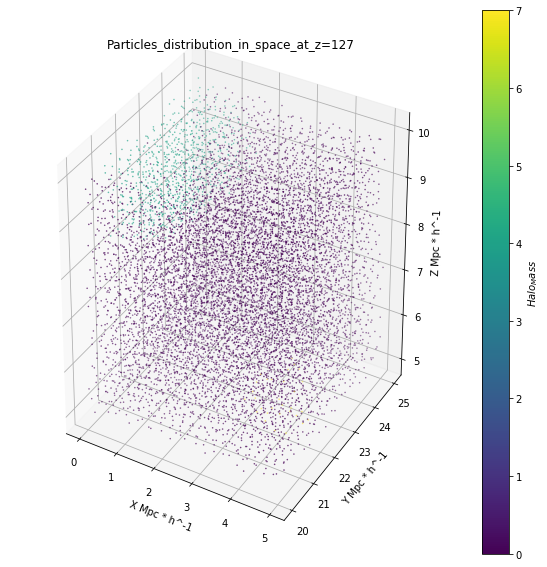

dx: 7  dy: 4  dz: 3


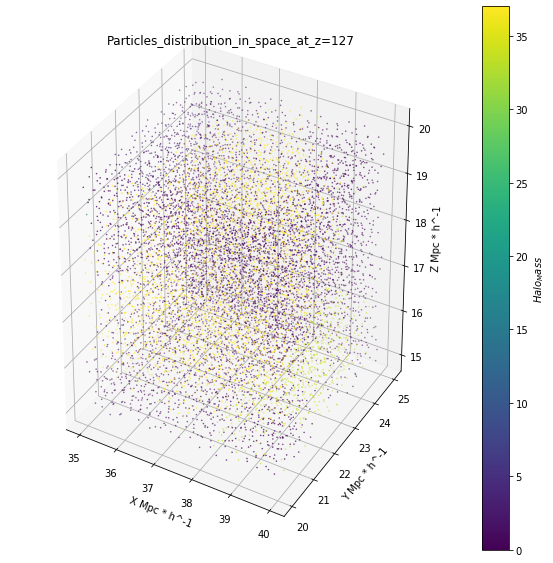

dx: 2  dy: 7  dz: 9


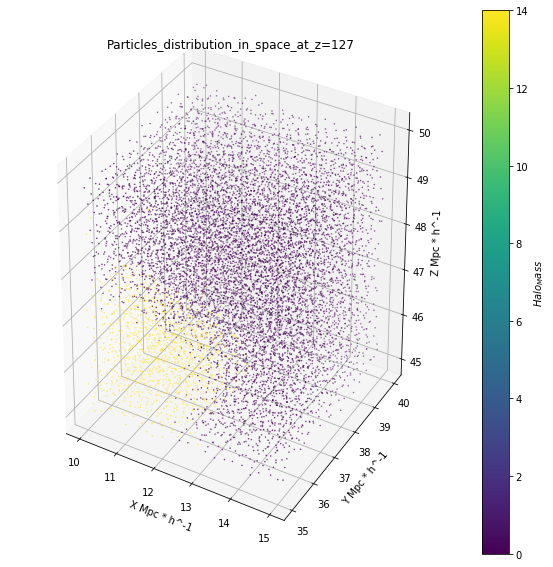

dx: 11  dy: 8  dz: 9


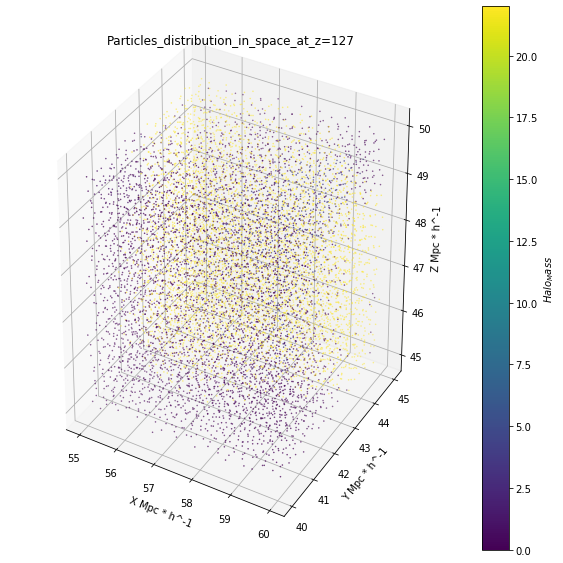

dx: 7  dy: 5  dz: 9


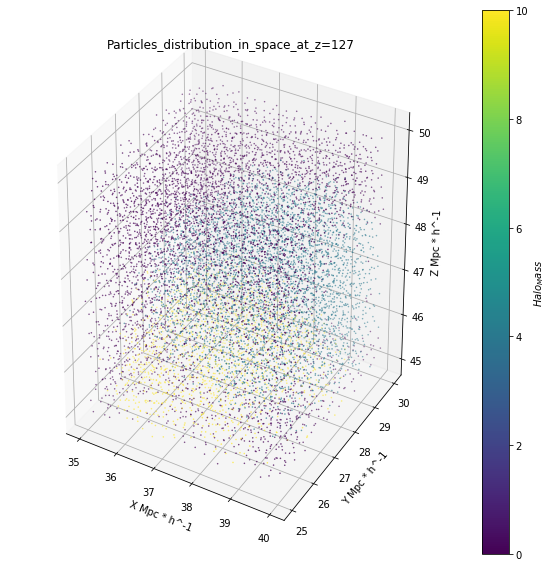

dx: 5  dy: 10  dz: 2


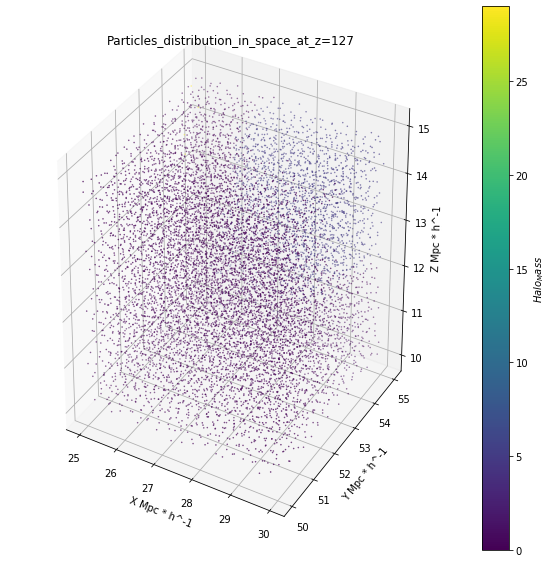

dx: 9  dy: 12  dz: 11


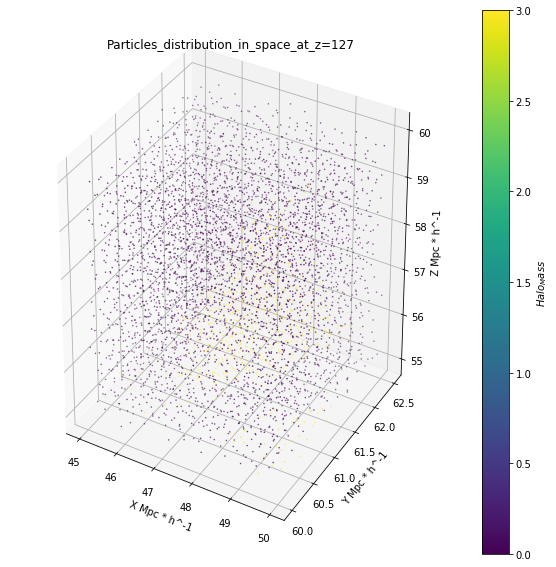

dx: 10  dy: 6  dz: 9


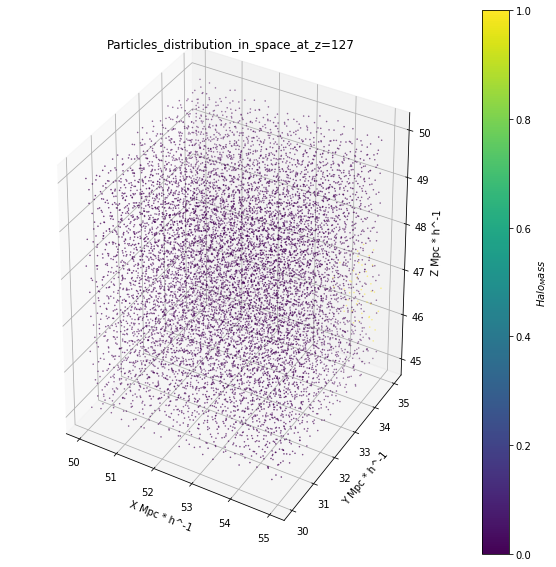

dx: 2  dy: 9  dz: 9


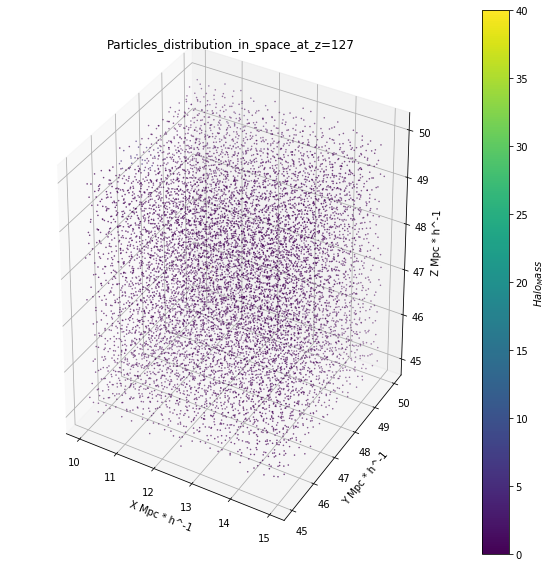

dx: 1  dy: 3  dz: 3


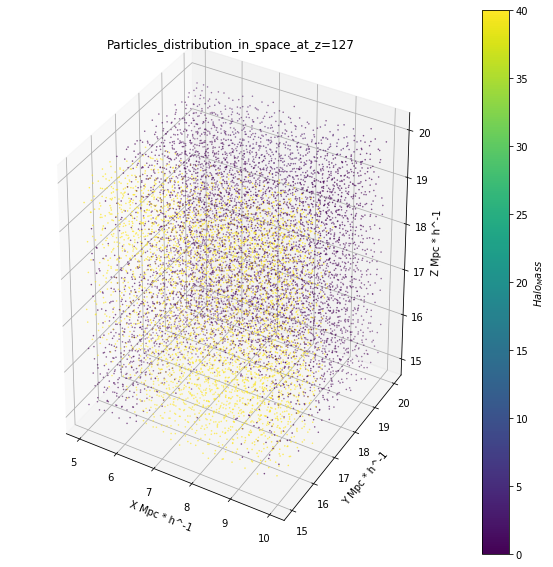

dx: 0  dy: 1  dz: 3


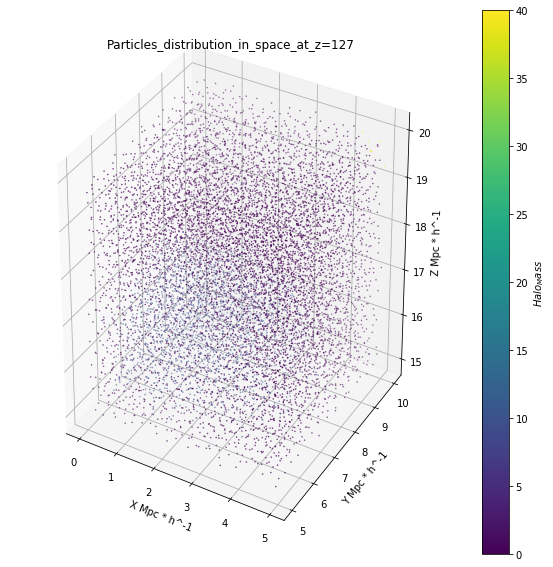

dx: 10  dy: 6  dz: 4


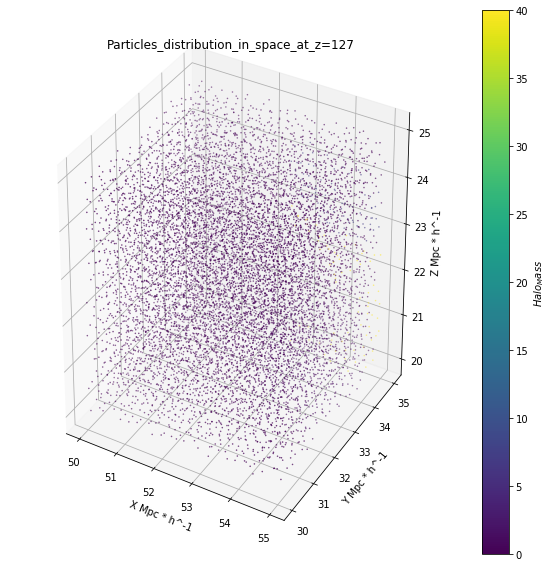

dx: 10  dy: 10  dz: 12


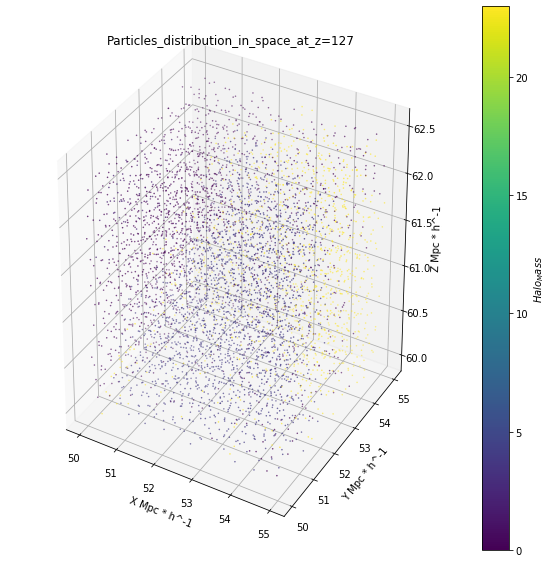

dx: 3  dy: 2  dz: 11


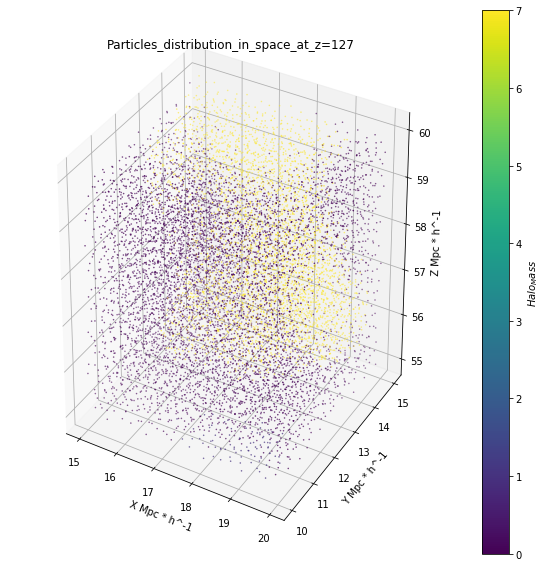

dx: 3  dy: 8  dz: 1


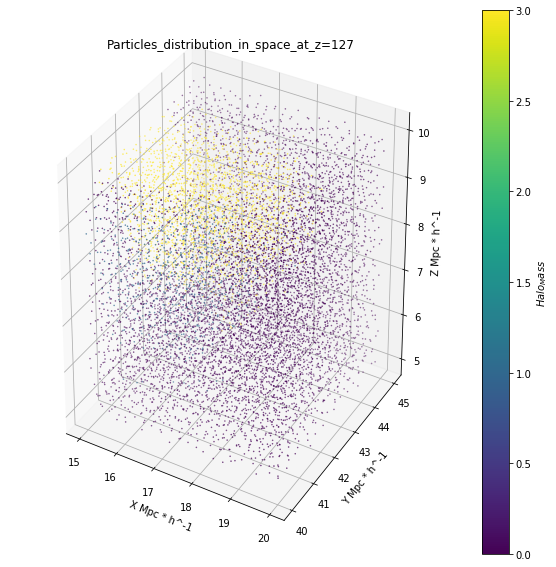

dx: 4  dy: 10  dz: 8


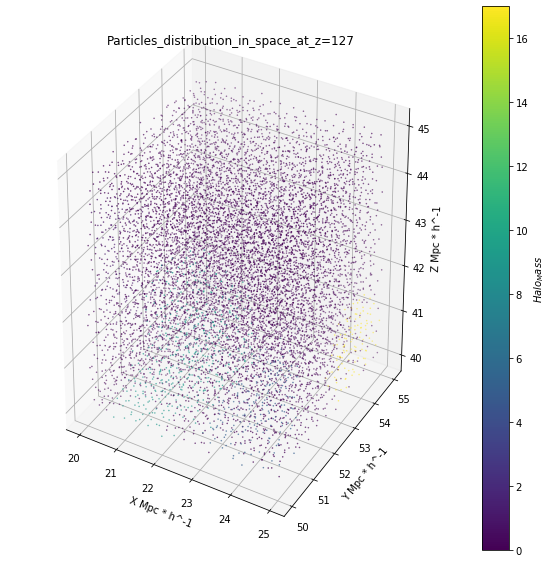

dx: 6  dy: 3  dz: 0


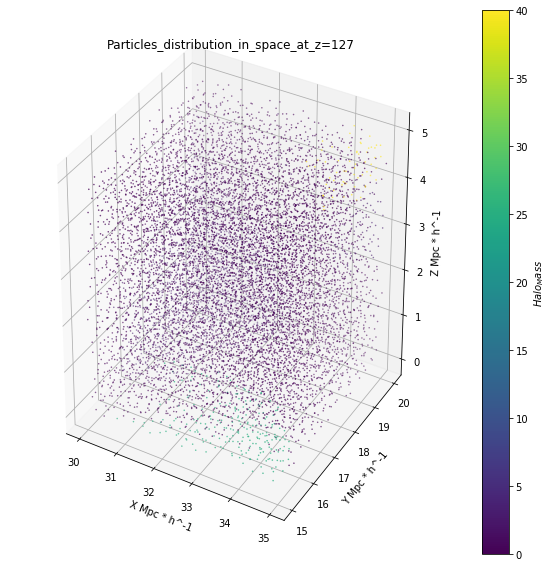

dx: 10  dy: 12  dz: 11


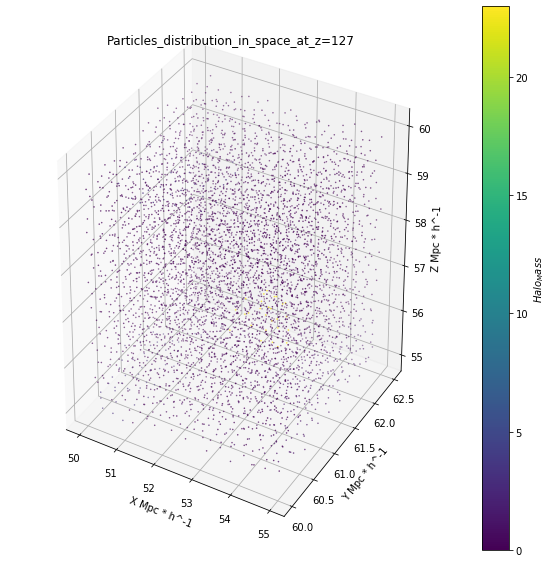

dx: 2  dy: 1  dz: 11


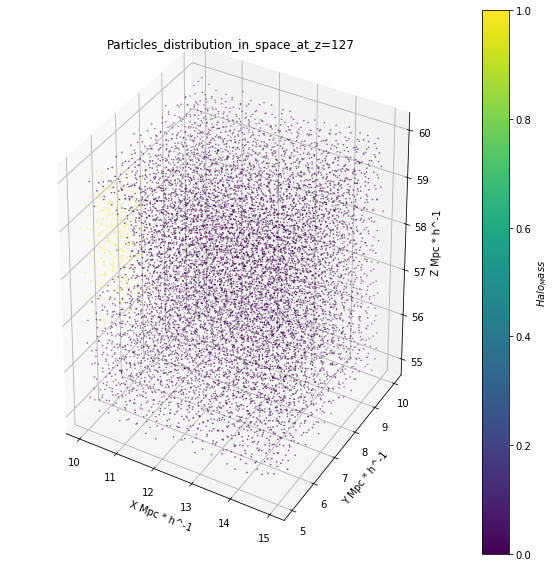

dx: 4  dy: 6  dz: 10


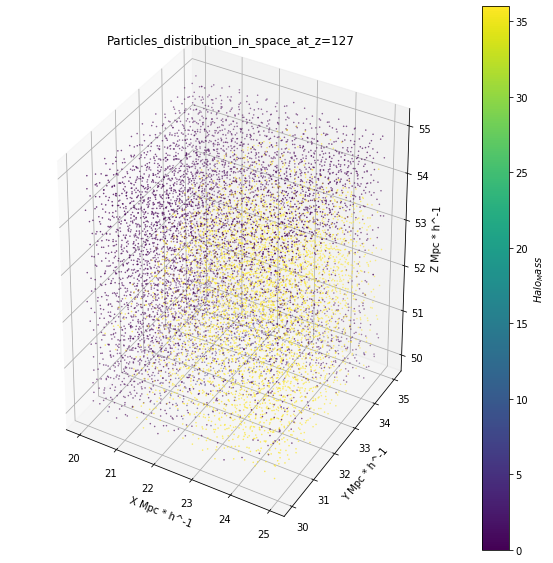

dx: 0  dy: 0  dz: 4


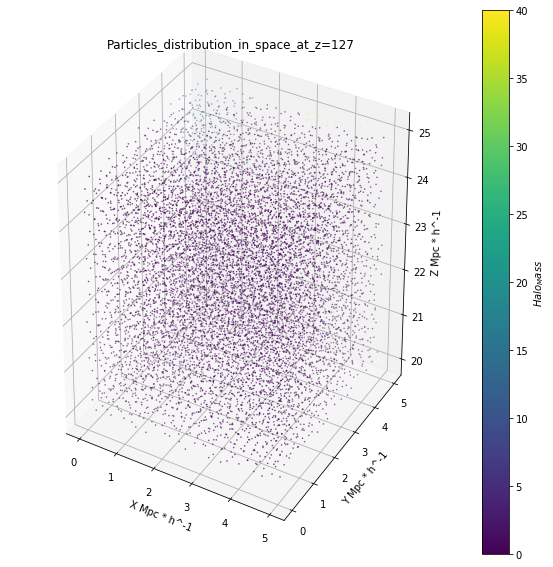

dx: 11  dy: 0  dz: 2


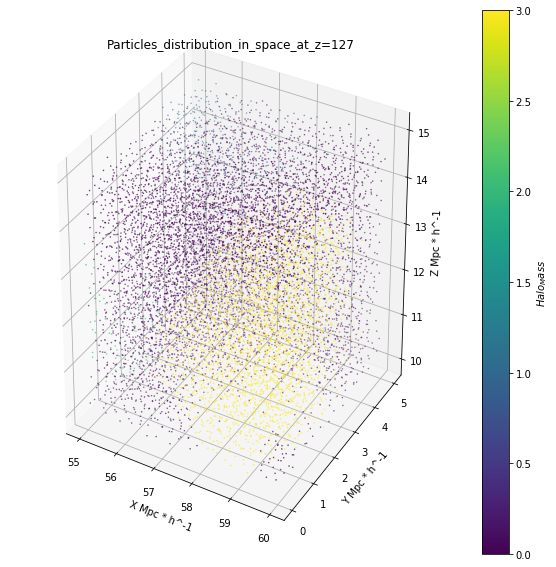

dx: 2  dy: 5  dz: 5


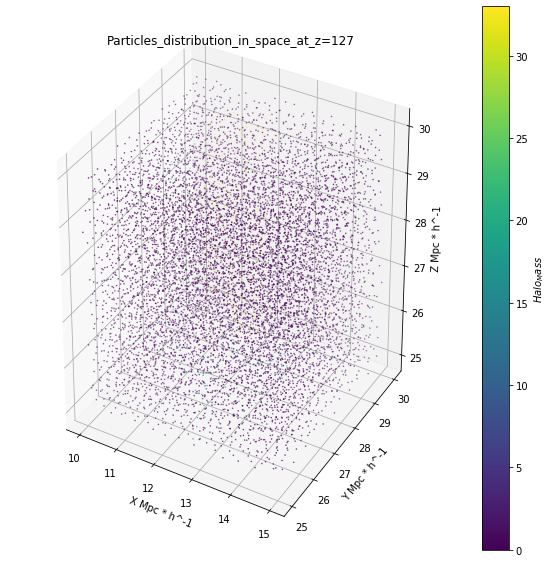

dx: 1  dy: 9  dz: 3


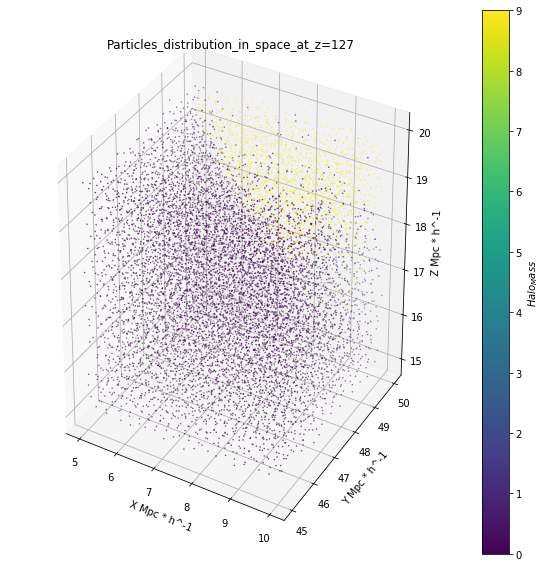

dx: 12  dy: 12  dz: 12


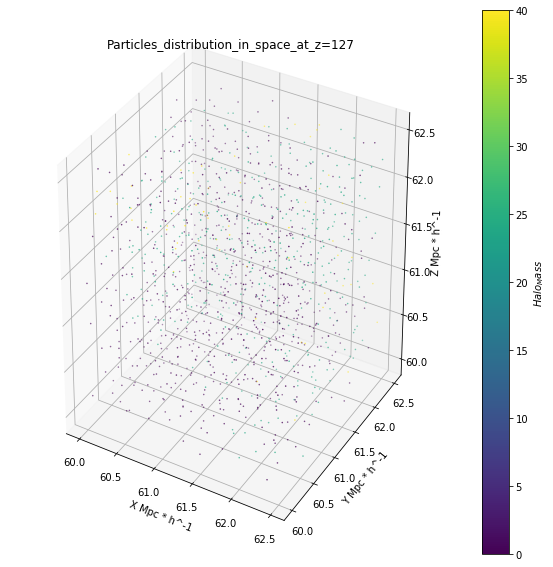

dx: 3  dy: 11  dz: 0


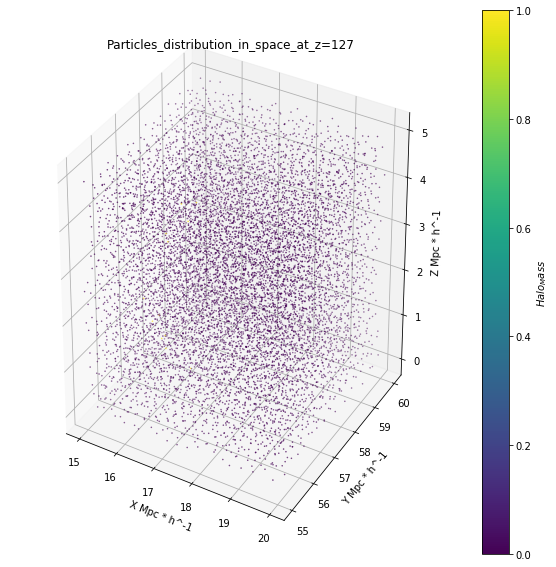

dx: 11  dy: 11  dz: 12


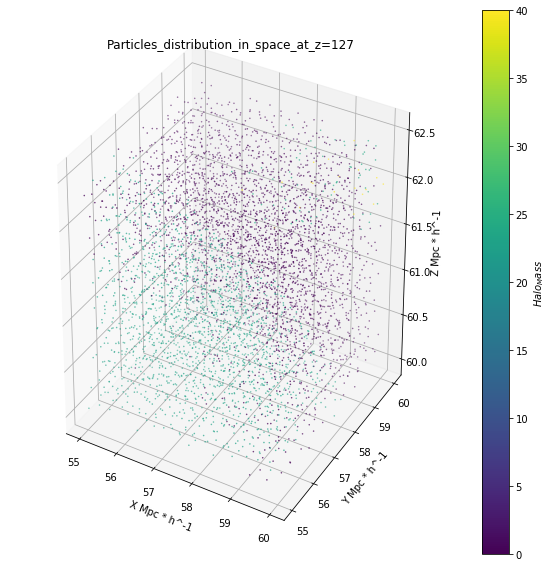

dx: 5  dy: 8  dz: 4


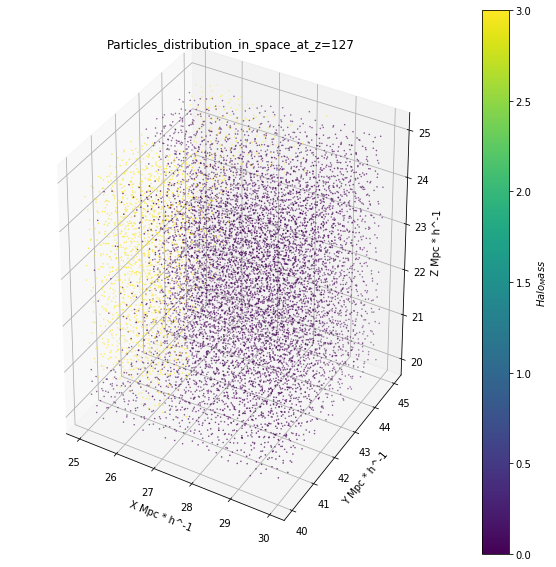

dx: 0  dy: 12  dz: 8


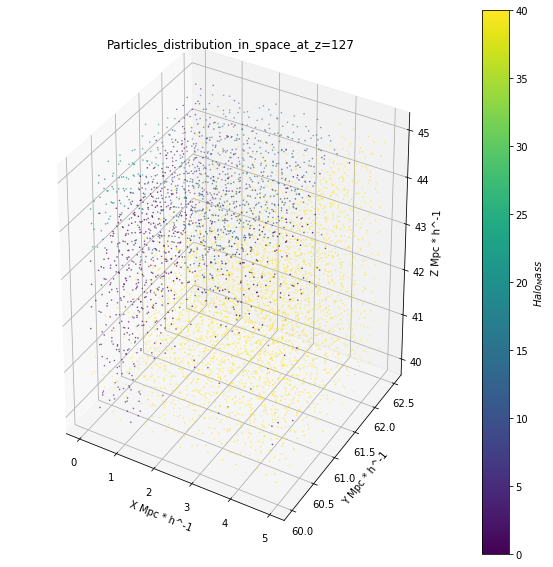

dx: 8  dy: 2  dz: 1


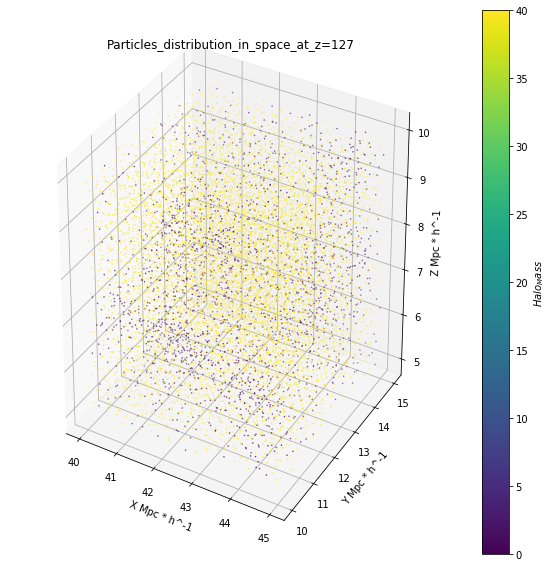

dx: 7  dy: 12  dz: 1


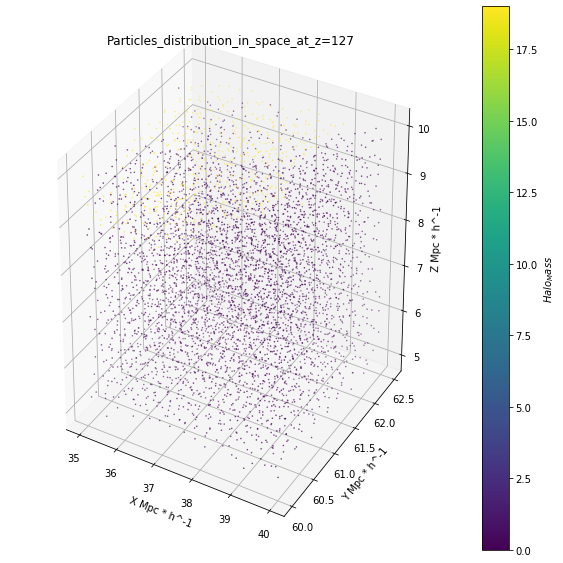

dx: 8  dy: 1  dz: 11


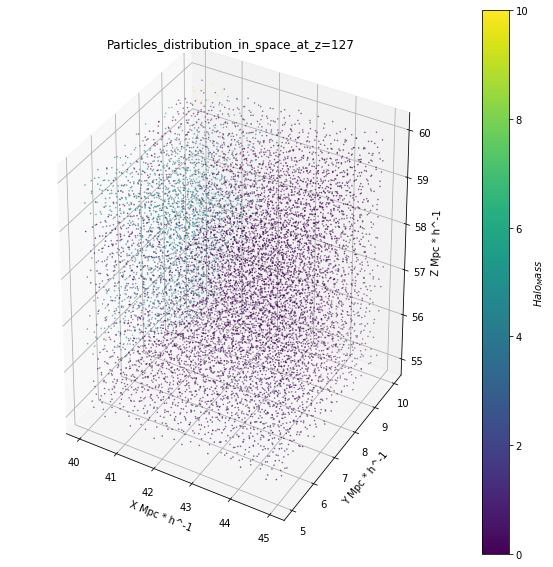

dx: 9  dy: 0  dz: 1


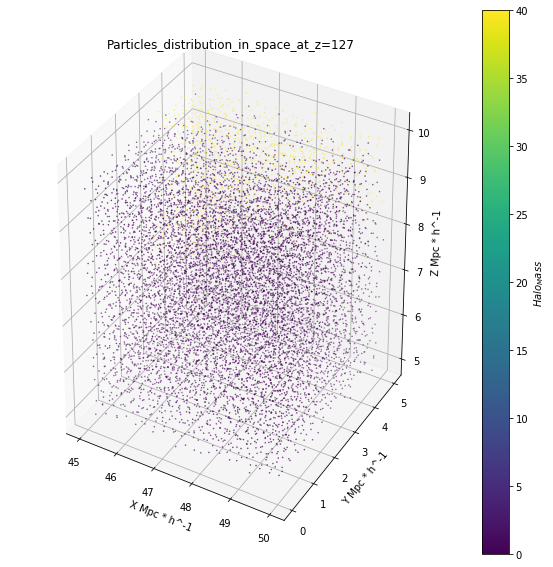

dx: 12  dy: 12  dz: 11


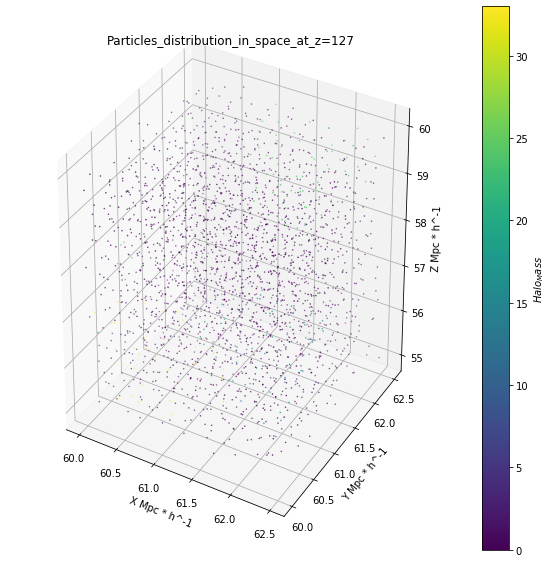

dx: 6  dy: 4  dz: 7


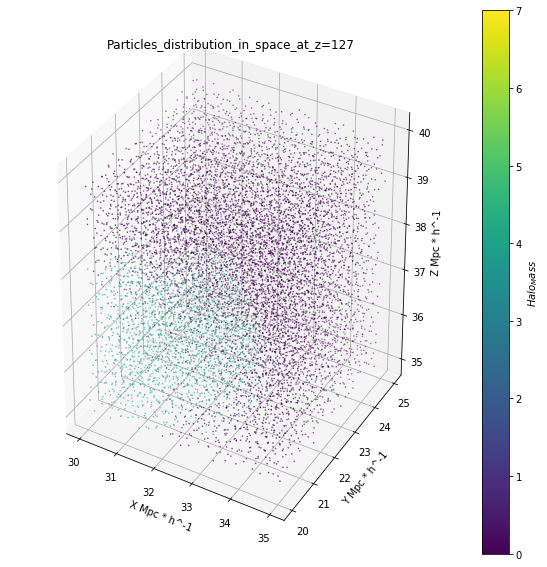

dx: 6  dy: 5  dz: 3


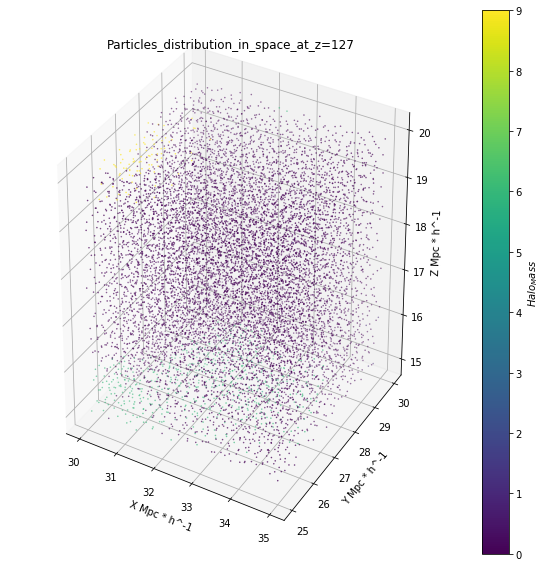

dx: 1  dy: 9  dz: 4


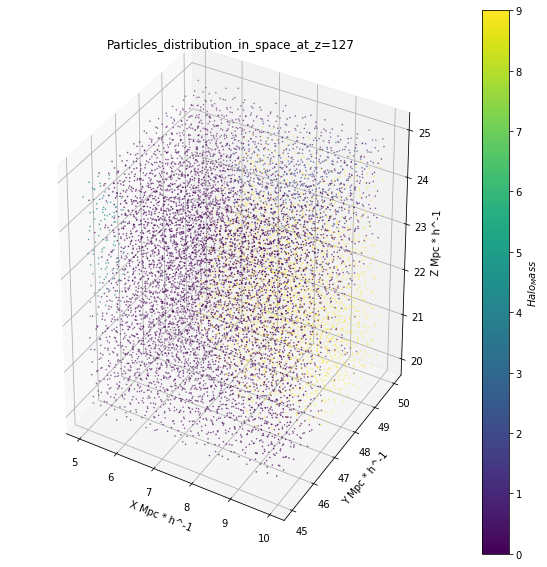

dx: 11  dy: 1  dz: 12


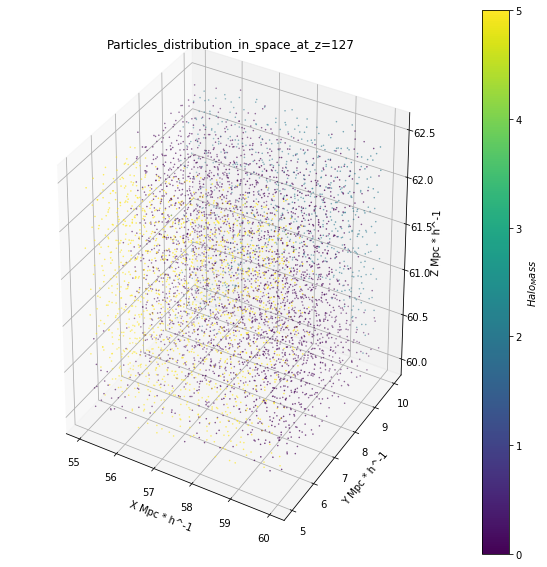

dx: 1  dy: 9  dz: 12


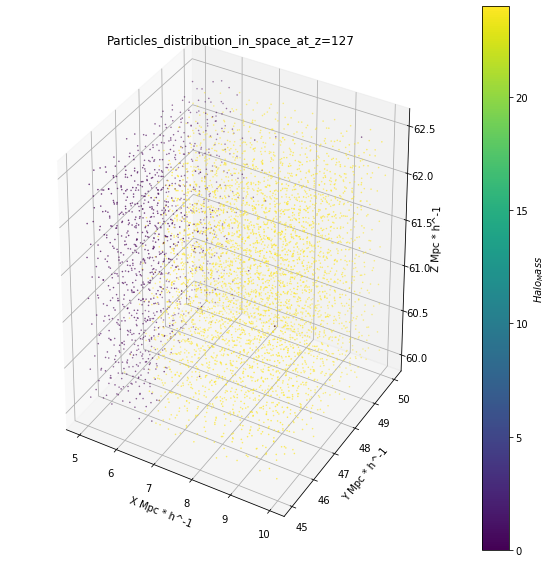

dx: 6  dy: 12  dz: 7


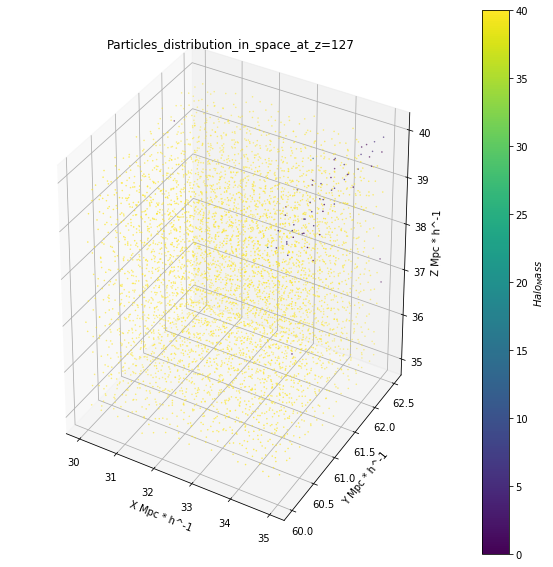

dx: 9  dy: 12  dz: 8


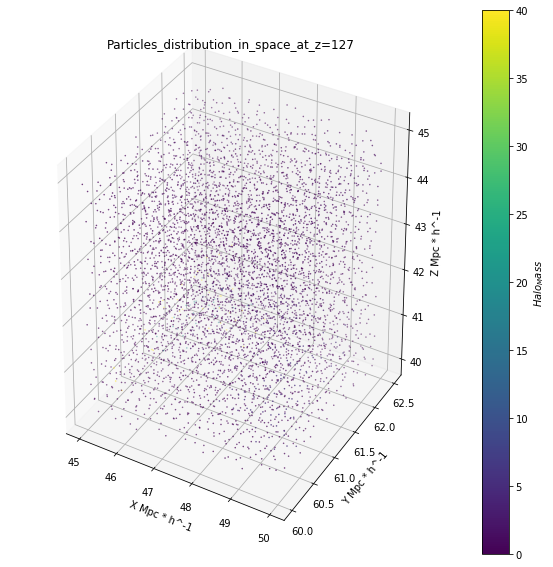

dx: 1  dy: 5  dz: 12


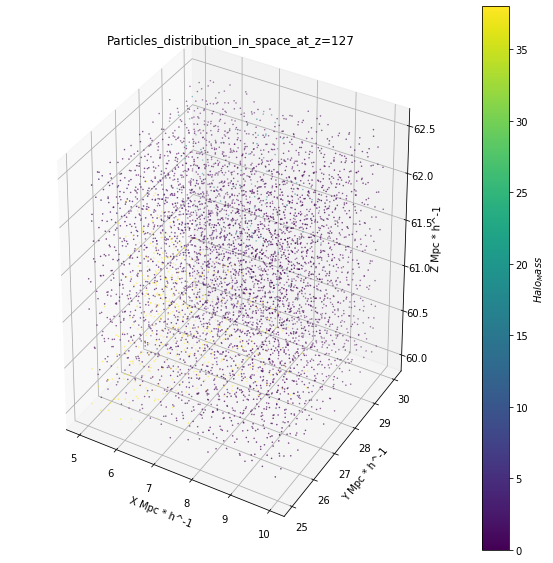

dx: 6  dy: 7  dz: 1


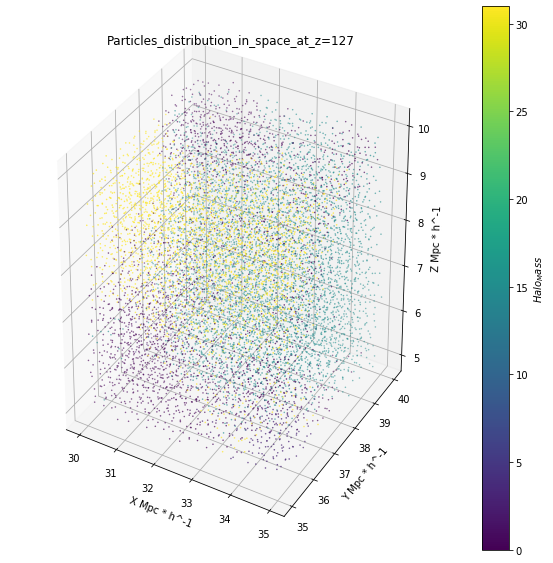

dx: 5  dy: 5  dz: 2


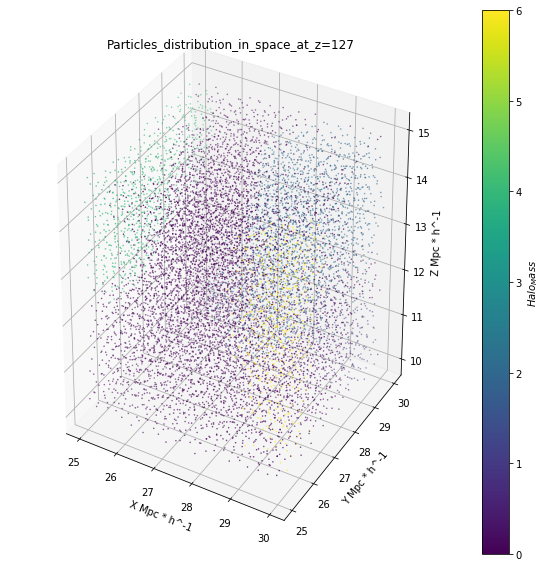

dx: 11  dy: 12  dz: 8


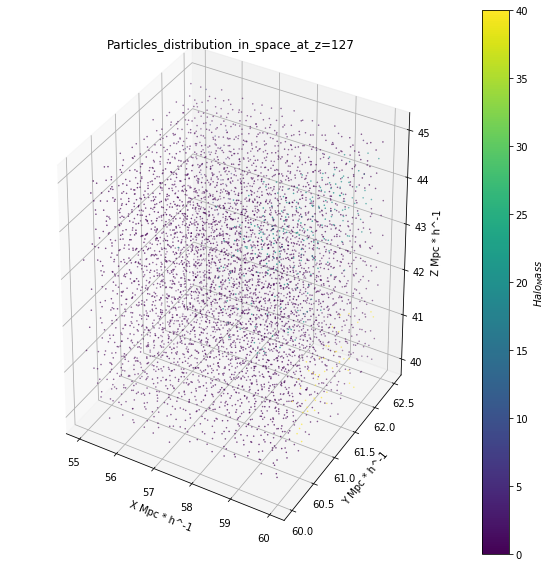

dx: 11  dy: 2  dz: 0


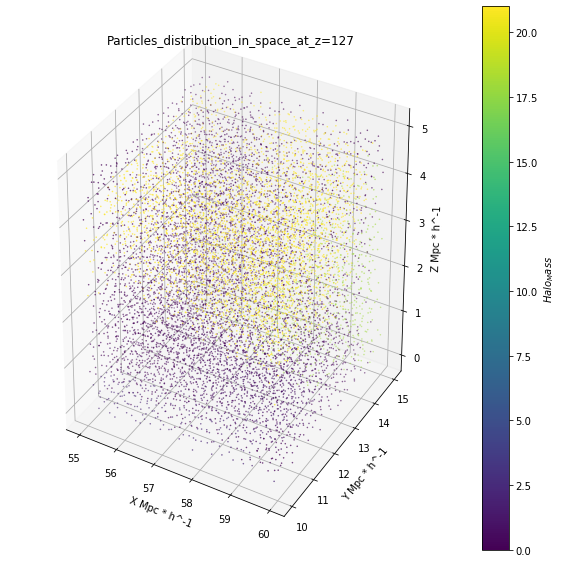

dx: 0  dy: 10  dz: 9


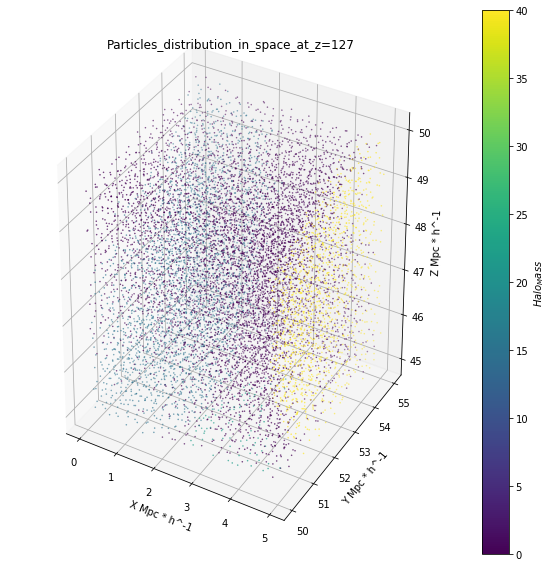

dx: 9  dy: 10  dz: 1


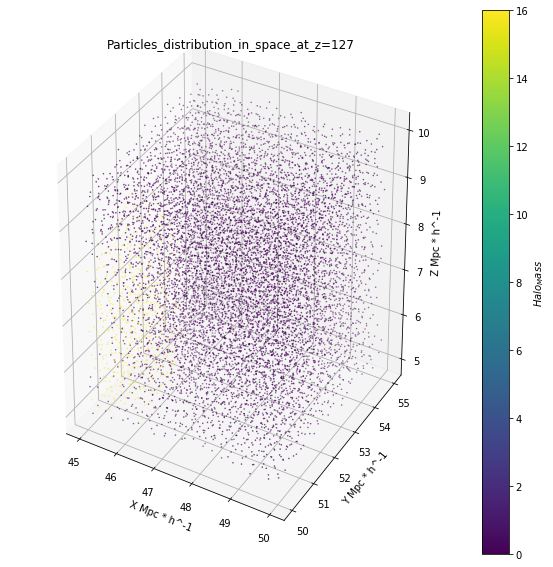

{0: array([[  0.       ,  34.       ,   4.936237 , ...,  81.       ,
          2.       ,   1.       ],
       [  0.       ,  34.       ,   4.935366 , ...,  80.       ,
          7.       ,   1.       ],
       [  0.       ,  34.       ,   4.9075274, ...,  80.       ,
         11.       ,   1.       ],
       ...,
       [  0.       ,  37.       ,   4.398352 , ..., 120.       ,
          0.       ,   1.       ],
       [  0.       ,  37.       ,   4.1195607, ..., 123.       ,
          0.       ,   1.       ],
       [  0.       ,  37.       ,   4.0341473, ..., 119.       ,
          0.       ,   1.       ]]), 1: array([[0.0000000e+00, 1.7697000e+04, 3.4096550e+01, ..., 1.5500000e+02,
        6.3900000e+02, 1.0000000e+00],
       [0.0000000e+00, 1.7696000e+04, 3.3992504e+01, ..., 1.5700000e+02,
        6.3500000e+02, 1.0000000e+00],
       [0.0000000e+00, 1.7697000e+04, 3.4117027e+01, ..., 1.5600000e+02,
        6.3200000e+02, 1.0000000e+00],
       ...,
       [0.0000000e+00, 3.136000

In [3]:
#Implementing train and test sets:
import random
#box size:
tl = 5

x_train = {}
for num in range(50):
    
    #place of the box:
    dx = random.randint(0,12)
    dy = random.randint(0,12)
    dz = random.randint(0,12)
    
    print('dx:', dx, ' dy:' , dy, ' dz:', dz)
    t = data[ data[:,2] > dx * tl ]
    t = t[ t[:,2] < (dx+1)*tl ]
    t = t[ t[:,3] > (dy)*tl ]
    t = t[ t[:,3] < (dy+1)*tl ]
    t = t[ t[:,4] > (dz)*tl ]
    t = t[ t[:,4] < (dz+1)*tl ]

    #Showing the train set:
    fig = plt.figure(figsize=(10,10))
    ax = fig.add_subplot(111, projection='3d')

    # load some test data for demonstration and plotting
    title = 'Particles_distribution_in_space_at_z=127'
    ax.set_title(title)
    p = ax.scatter(t[:,2], t[:,3], t[:,4], s = 0.3, c= t[:,9] , cmap= 'viridis')
    ax.set_xlabel('X Mpc * h^-1')
    ax.set_ylabel('Y Mpc * h^-1')
    ax.set_zlabel('Z Mpc * h^-1')
    cb = fig.colorbar(p)
    cb.set_label('$Halo_Mass$')
    cb.mappable.set_clim([min(t[:,9]),max(t[:,9])])
    plt.show()
    
    x_train[num] = t
#     if num ==0:
#         train_set = t
#     else:
#         train_set = np.append(train_set, t, axis = 0)
        
        
print(x_train)

In [4]:
len(x_train)

50

In [5]:
col = ['snapnum','phkey','x','y','z','vx','vy','vz','id','In_halo','halo_mass','i','j','k','c']
train_set = {}
for num in range(50):
    o = pd.DataFrame(x_train[num], columns = col)
    o['i'] = o['i'].astype(int)
    o['j'] = o['j'].astype(int)
    o['k'] = o['k'].astype(int)
    print(len(o))
    print(o.head(300))
    train_set[num] = o


10181
     snapnum  phkey         x         y         z         vx         vy  \
0        0.0   34.0  4.936237  5.099366  0.175033 -341.00403 -124.62918   
1        0.0   34.0  4.935366  5.031730  0.457365 -368.47232 -125.98487   
2        0.0   34.0  4.907527  5.046777  0.722340 -365.55510 -135.98120   
3        0.0   34.0  4.818730  5.240482  0.580607 -333.67960 -115.22601   
4        0.0   34.0  4.997344  5.478589  0.566810 -313.81534 -106.04418   
..       ...    ...       ...       ...       ...        ...        ...   
295      0.0   58.0  3.835388  5.363676  2.224697 -435.77760 -210.01155   
296      0.0   35.0  4.068627  5.404144  2.278452 -428.74550 -194.08063   
297      0.0   35.0  4.217532  5.537702  2.125342 -414.81424 -199.08717   
298      0.0   35.0  4.104612  5.759304  2.155516 -417.31600 -228.25235   
299      0.0   35.0  4.298895  5.668595  2.309721 -437.35483 -211.75725   

            vz       id  In_halo  halo_mass   i   j   k    c  
0    59.098000  20322.0      0

     snapnum  phkey         x         y          z         vx          vy  \
0        0.0  385.0  4.844982  8.330350  15.355892 -222.62863  191.394800   
1        0.0  385.0  4.926557  8.689272  15.510042 -193.66093  183.308200   
2        0.0  385.0  4.849199  8.627041  15.287750 -191.59247  187.615970   
3        0.0  385.0  4.847126  8.652246  15.011142 -205.42213  179.309650   
4        0.0  385.0  4.890944  8.437080  15.118341 -195.80959  202.388180   
..       ...    ...       ...       ...        ...        ...         ...   
295      0.0  446.0  2.990851  8.684499  15.090371 -303.91608  122.303764   
296      0.0  446.0  2.935899  8.409152  15.031947 -294.64917  230.075350   
297      0.0  446.0  2.915949  8.164441  15.105971 -285.32922  241.958900   
298      0.0  446.0  3.282940  7.830355  15.086800 -301.10810  237.930790   
299      0.0  446.0  2.957229  7.931817  15.037863 -301.15427  227.124370   

            vz        id  In_halo  halo_mass   i    j    k    c  
0    13.4

9798
     snapnum   phkey          x          y         z         vx         vy  \
0        0.0  4772.0  15.198106  57.165886  4.936335 -291.03394 -326.94492   
1        0.0  4772.0  15.283578  57.535786  4.982014 -299.49677 -313.65520   
2        0.0  4772.0  15.403748  56.752956  4.899698 -232.42337 -318.66263   
3        0.0  4772.0  15.050568  57.612267  4.969541 -324.98820 -331.89740   
4        0.0  4772.0  15.366804  58.498825  4.989542 -246.21838 -299.31293   
..       ...     ...        ...        ...       ...        ...        ...   
295      0.0  4784.0  15.349491  58.672142  2.129676 -358.01358 -201.01031   
296      0.0  4791.0  15.256520  58.598260  1.912912 -393.30510 -158.47745   
297      0.0  4784.0  15.220058  58.856110  2.213371 -353.46042 -197.32900   
298      0.0  4791.0  15.175257  58.845276  1.933311 -391.66483 -149.49983   
299      0.0  4784.0  15.321751  59.045395  2.074094 -346.94930 -175.39331   

             vz         id  In_halo  halo_mass    i    j  

     snapnum    phkey          x          y          z          vx  \
0        0.0  21686.0  47.657585  62.470790  44.956367   88.826980   
1        0.0  21686.0  47.430270  62.478333  44.960575  140.360470   
2        0.0  21681.0  47.613255  62.492256  44.081050  111.651230   
3        0.0  21681.0  47.496174  62.461155  44.290745  109.093414   
4        0.0  21681.0  47.708310  62.481453  44.411148   91.562860   
..       ...      ...        ...        ...        ...         ...   
295      0.0  21673.0  47.498795  61.209003  40.479557  -16.598423   
296      0.0  21673.0  47.828747  61.086143  40.658844   36.441837   
297      0.0  21673.0  47.713757  61.293330  40.554783   11.603168   
298      0.0  21673.0  47.657560  61.476055  40.694443    1.594622   
299      0.0  21673.0  47.464413  61.449493  40.507480  -27.578499   

             vy          vz          id  In_halo  halo_mass    i    j    k  \
0   -272.975980 -227.778870  10347085.0      0.0        0.0  762  999  719   
1  

In [6]:
print(train_set[0].head(30))

    snapnum  phkey         x         y         z         vx          vy  \
0       0.0   34.0  4.936237  5.099366  0.175033 -341.00403 -124.629180   
1       0.0   34.0  4.935366  5.031730  0.457365 -368.47232 -125.984870   
2       0.0   34.0  4.907527  5.046777  0.722340 -365.55510 -135.981200   
3       0.0   34.0  4.818730  5.240482  0.580607 -333.67960 -115.226010   
4       0.0   34.0  4.997344  5.478589  0.566810 -313.81534 -106.044180   
5       0.0   34.0  4.935998  5.343969  0.768467 -335.73180 -113.682200   
6       0.0   34.0  4.947104  5.615838  0.778857 -316.34454 -115.038820   
7       0.0   34.0  4.916574  5.705264  0.564423 -294.81314 -118.851900   
8       0.0   34.0  4.826524  5.636945  0.363039 -287.43484 -130.255300   
9       0.0   34.0  4.899045  5.631931  0.143322 -265.30975 -114.063090   
10      0.0   34.0  4.870585  5.357490  0.147187 -313.90363  -96.495800   
11      0.0   34.0  4.843518  5.409499  0.397874 -320.88670 -111.030396   
12      0.0   34.0  4.821

In [7]:
def dataframe_to_array(data , shape):
    ids = np.ravel_multi_index(data[['i' , 'j' , 'k']].values.T , shape)
    val = data.iloc[:,3]
    return np.bincount(ids , val , minlength = np.prod(shape)).reshape(shape)

def make_array(data, shape , column):
    mine = data.groupby(['i' , 'j' , 'k'])[column].mean().reset_index()
    arr_mine = dataframe_to_array(mine , shape)
    return arr_mine

In [10]:
X_train = np.zeros(50, dtype=object)
Y_train = np.zeros(50, dtype=object)


for num in range(50):
    print(num, 'th image made.')
    X_train[num] = np.stack( [make_array(train_set[num], (1001,1001,1001), 'vx')
                            ,make_array(train_set[num], (1001,1001,1001), 'vy')
                            ,make_array(train_set[num], (1001,1001,1001), 'vz')]
                            , axis =3)
    
    Y_train[num] = make_array(train_set[num], (1001,1001,1001), 'In_halo')

0 th image made.
1 th image made.


MemoryError: Unable to allocate array with shape (1003003001,) and data type float64